# Wahadło podwójne

## Cele projektu
1. **Znalezienie sposobu na numeryczne rozwiązanie układu nieliniowych równań różniczkowych drugiego stopnia**
2. **Stworzenie symulacji przedstawiającej ruch podwójnego wahadła**
3. Wyliczenie stosunku małej zmiany warunków początkowych (kątów jakie nici tworzą z pionem lub szybkości kątowych) do różnicy stanów podwójnego wahadła po pewnym czasie t
4. Zobrazowanie (np. poprzez animację) wpływu jaki na ruch podwójnego wahadła wywiera zmiana mas punktów materialnych lub długości nici
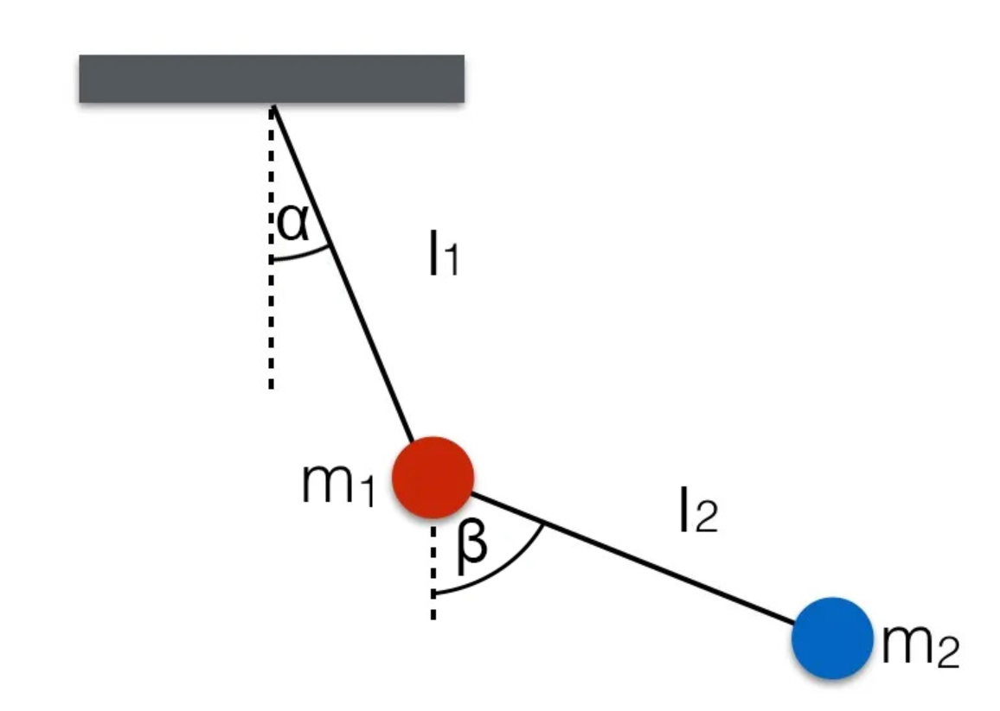

## Algorytm RK4
\begin{equation}
    \frac{dy}{dt} = f(t,y),~~~~ y(t_{0}) = y_{0}           
\end{equation}
<br>
\begin{equation}
    y_{n+1} = y_{n} + \frac{1}{6}(k_{1} + 2\,k_{2} + 2\,k_{3} + k_{4})
\end{equation}
<br>
\begin{equation}
    t_{n+1} = t_{n} + h
\end{equation}
<br>
\begin{equation}
    k_{1} = hf(t_{n},y_{n})
\end{equation}
\begin{equation}
    k_{2} = hf(t_{n} + \frac{h}{2},y_{n} + \frac{k_{1}}{2})
\end{equation}
\begin{equation}
    k_{3} = hf(t_{n} + \frac{h}{2},y_{n} + \frac{k_{2}}{2})
\end{equation}
\begin{equation}
    k_{4} = hf(t_{n} + h,y_{n} + k_{3})
\end{equation}
<br><br>
https://en.wikipedia.org/wiki/Runge%E2%80%93Kutta_methods#The_Runge%E2%80%93Kutta_method

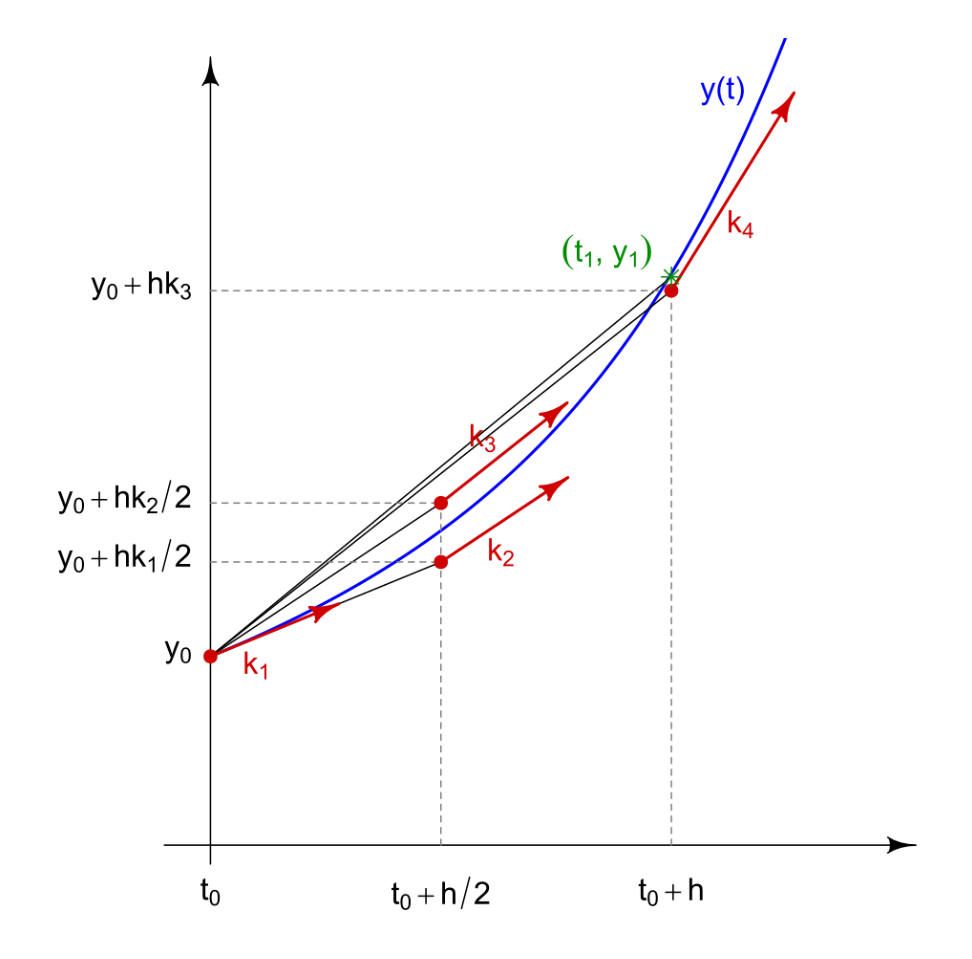By HilberTraum - Own work, CC BY-SA 4.0, https://commons.wikimedia.org/w/index.php?curid=64366870}}

In [ ]:
#Przykładowa implementacja algorytmu RK45

## Lagrangian
Lagrangian $\mathscr{L}$ układu definiujemy jako różnicę energii kinetycznej i potencjalnej <br><br>
$$\mathscr{L} = T - V$$
gdzie: $$T = \frac{1}{2}\sum_{i=1}^{N} m_{i}v_{i}^2$$
<br>
$$V = \sum_{i=1}^{N} V_{i}$$
N - liczba cząstek układu <br>
$m_{i}$ - masa i-tej cząstki układu <br>
$v_{i}$ - prędkość i-tej cząstki układu <br>
$V_{i}$ - energia potencjalna i-tej cząstki układu
<br>
W naszym przypadku: <br>
$$N = 2$$
$$v_{1}^2 = \dot{\theta_{1}}^2l_{1}^2$$
$$v_{2}^2 = \dot{\theta_{1}}^2l_{1}^2 + \dot{\theta_{2}}^2l_{2}^2 + 
            2\,\dot{\theta_{1}}\dot{\theta_{2}}l_{1}l_{2}\cos(\theta_{1} - \theta_{2})$$
$$V_{1} = m_{1}gl_{1}\cos\theta_{1}$$
$$V_{2} = m_{2}g(l_{1}\cos\theta_{1} + l_{2}\cos\theta_{2})$$
<br>
A więc Lagrangian $\mathscr{L}$ przyjmuje wartość <br><br>
\begin{equation}
    \mathscr{L} = \frac{m_{1}}{2}\dot{\theta_{1}}^2l_{1}^2 + \frac{m_{2}}{2}[\dot{\theta_{1}}^2l_{1}^2 
    + \dot{\theta_{2}}^2l_{2}^2 + 2\,\dot{\theta_{1}}\dot{\theta_{2}}l_{1}l_{2}\cos(\theta_{1} -
    \theta_{2})] + m_{1}gl_{1}\cos\theta_{1} + m_{2}g(l_{1}\cos\theta_{1} + l_{2}\cos\theta_{2})
\end{equation}

## Równania Lagrange'a - Eulera
W naszym przypadku mamy doczynienia z układem dwóch równań różniczkowych, które otrzymujemy ze wzoru:
<br>
<br>

$$\frac{\partial\mathscr{L}}{\partial \theta_{i}} - \frac{\mathrm{d}}{\mathrm{d}t} \frac{\partial \mathscr{L}}{\mathrm{d}\dot{\theta_{i}}} = 0$$

Po podstawieniu i policzeniu pochodnych otrzymujemy układ równań: <br><br>
\begin{equation}
    \begin{cases}
        (m_{1} + m_{2})l_{1}\ddot{\theta_{1}} + m_{2}l_{2}\ddot{\theta_{2}}\cos(\theta_{1} - 
        \theta_{2}) + m_{2}l_{2}\dot{\theta_{2}}^2\sin(\theta_{1} - \theta_{2}) +
         (m_{1} + m_{2})g\sin\theta_{1} = 0
    \\
        l_{2}\ddot{\theta_{2}} + l_{1}\ddot{\theta_{1}}\cos(\theta_{1} - \theta_{2}) - 
        l_{1}\dot{\theta_{1}}^2\sin(\theta_{1} - \theta_{2}) + g\sin\theta_{2} = 0
    \end{cases}
\end{equation}

Układ równań możemy zapisać w postacii mnożenia macierzy: <br><br>
$$
    \begin{bmatrix}
        (m_{1} + m_{2})l_{1} & m_{2}l_{2}\cos(\theta_{1} - \theta_{2}) 
        \\
        l_{1}\cos(\theta_{1} - \theta_{2}) & l_{2}
    \end{bmatrix}
    \times
    \begin{bmatrix}
        \ddot{\theta_{1}}
        \\
        \ddot{\theta_{2}}
    \end{bmatrix}
    =
    \begin{bmatrix}
       - m_{2}l_{2}\dot{\theta_{2}}^2\sin(\theta_{1} - \theta_{2}) - (m_{1} + m_{2})g\sin\theta_{1}
       \\
       l_{1}\dot{\theta_{1}}^2\sin(\theta_{1} -\theta_{2}) - g\sin\theta_{2}
    \end{bmatrix}
$$
Co możemy też zapisać jako <br><br>
$$
[M]\ddot{\theta} = F
$$
Z czego wynika <br><br>
$$
\ddot{\theta} = [M]^{-1}F
$$
<br><br>
https://en.wikipedia.org/wiki/Lagrangian_mechanics#The_Lagrangian

## Przygotowanie do zaimplementowania algorytmu RK4
Algorytmu RK4 możemy użyć wtedy gdy szukamy rozwiąnia równania różniczkowego pierwszego stopnia. Póki co mamy tylko równania drugiego stopnia.<br>Z tego powodu definiujemy: <br><br>
$$
    y = 
    \begin{bmatrix}
        \dot{\theta}
        \\
        \theta
    \end{bmatrix}
$$
Wtedy <br><br>
$$
    \dot{y} = 
    \begin{bmatrix}
        \ddot{\theta}
        \\
        \dot{\theta}
    \end{bmatrix}
    =
    \begin{bmatrix}
        [M]^{-1}F
        \\
        \dot{\theta}
    \end{bmatrix}
    =
    G(y,t)
$$
<br>
Na koniec ciągłą pochodną przybliżamy dyskretnie: <br><br>
$$
    \dot{y} \approx \frac{y_{n+1} - y_{n}}
                                            {\Delta t}
$$
$$
    G(y,t) \approx \frac{y_{n+1} - y_{n}}
                                            {\Delta t}
$$
$$
    y_{n+1} \approx y_{n} + G(y,t)\Delta t
$$
Teraz jesteśmy gotowi do użycia algorytmu
<br><br>
https://www.youtube.com/watch?v=nBBQKZb6JZk

In [1]:
#kod  

using Plots
using LinearAlgebra
using DataFrames



function G(Z, t, g, m1, m2, l1, l2)

    a1dt, a2dt = Z[1], Z[2]
    a1, a2 = Z[3], Z[4]

    m11, m12 = (m1+m2)*l1, m2*l2*cos(a1-a2)
    m21, m22 = l1*cos(a1-a2), l2

    M = [m11 m12 ; m21 m22]

    f1 = -m2*l2*a2dt*a2dt*sin(a1-a2) - (m1+m2)*g*sin(a1)
    f2 = l1*a1dt*a1dt*sin(a1-a2) - g*sin(a2)

    F = [f1 ; f2]

    acc = inv(M)*F

    return [acc[1], acc[2], a1dt, a2dt]
end

function Step(Z, t, h, g, m1, m2, l1, l2)

    k1 = h*G(Z, t, g, m1, m2, l1, l2)
    k2 = h*G(Z + k1/2, t + h/2, g, m1, m2, l1, l2)
    k3 = h*G(Z + k2/2, t+ h/2, g, m1, m2, l1, l2)
    k4 = h*G(Z+ k3, t + h, g, m1, m2, l1, l2)

    return Z + (k1+2*k2+2*k3+k4)/6
end

g = 9.81
m1 = 1
m2 = 2
l1 = 2
l2 = 2.5
Z0 = [1, -1, π, π]
t0 = 1
h = 0.05
t = t0

KONIEC = 100

dane = [[Z0,t0]]
while t < KONIEC
    append!(dane, [[Step(dane[end][1], t, h, g, m1, m2, l1, l2), t+h]])
    t = t+h
end

czas = []
alfa = []
beta = []
alfadt = []
betadt = []

for j in 1:length(dane)
    append!(alfadt, dane[j][1][1])
    append!(betadt, dane[j][1][2])
    append!(alfa, dane[j][1][3])
    append!(beta, dane[j][1][4])
    append!(czas, dane[j][2])
end

dat = DataFrame(t = czas, alfa = alfa, beta = beta, alfadt = alfadt, betadt = betadt);

In [4]:
println(dat)

1982×5 DataFrame
  Row │ t       alfa        beta        alfadt       betadt      
      │ Any     Any         Any         Any          Any         
──────┼──────────────────────────────────────────────────────────
    1 │ 1       3.14159     3.14159     1.0          -1.0
    2 │ 1.05    3.19191     3.09129     1.01905      -1.01808
    3 │ 1.1     3.24407     3.03925     1.07212      -1.06827
    4 │ 1.15    3.29951     2.9841      1.14847      -1.13992
    5 │ 1.2     3.35908     2.92512     1.23474      -1.21971
    6 │ 1.25    3.42297     2.86218     1.3199       -1.29647
    7 │ 1.3     3.49095     2.79563     1.39799      -1.36387
    8 │ 1.35    3.56263     2.72599     1.46783      -1.42005
    9 │ 1.4     3.63762     2.6538      1.53119      -1.46573
   10 │ 1.45    3.71569     2.57956     1.59112      -1.50244
   11 │ 1.5     3.79674     2.50368     1.65111      -1.53145
   12 │ 1.55    3.88086     2.42654     1.71495      -1.55323
   13 │ 1.6     3.96837     2.34849     1.787

 1982 │ 100.05  66.3203     94.6806     -0.93055     0.191691


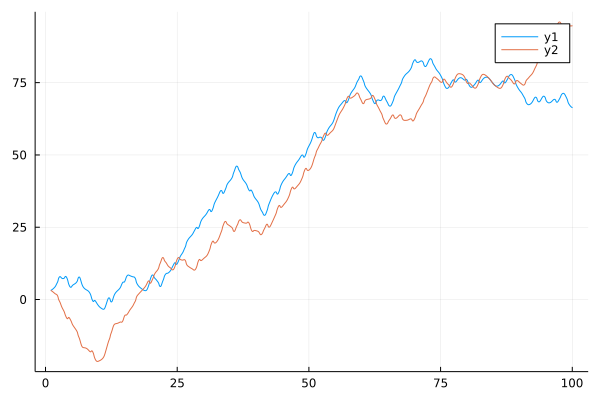

In [2]:
plot(dat.t, dat.alfa)
plot!(dat.t, dat.beta)

## Animacja

┌ Info: Saved animation to 
│   fn = C:\Users\adamm\wahadlo.gif
└ @ Plots C:\Users\adamm\.julia\packages\Plots\NQpB8\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\adamm\\wahadlo.gif")
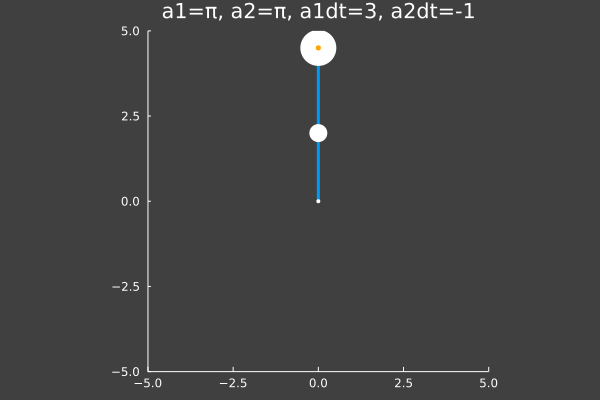

In [3]:
lista1 = []
lista2 = []
for j in 1:length(dat.alfa)
    append!(lista1, l1*sin(dat.alfa[j]) + l2*sin(dat.beta[j]))
    append!(lista2, -l1*cos(dat.alfa[j]) - l2*cos(dat.beta[j]))
end

a = @animate for t in 1:length(dat.alfa)
    plot([0,l1*sin(dat.alfa[t]), l1*sin(dat.alfa[t]) + l2*sin(dat.beta[t])], 
        [0,-l1*cos(dat.alfa[t]), -l1*cos(dat.alfa[t]) - l2*cos(dat.beta[t])], 
        xlim = (-5,5),
        ylim = (-5,5),
        grid = :off,
        ratio = :equal,
        linewidth = 3,
        label = "",
        background_color = :grey25,
        legend = :none,
        title = "a1=π, a2=π, a1dt=3, a2dt=-1"
    )
    scatter!([0],
        [0],
        markersize = 3,
        markercolor = :white
        )
    scatter!([l1*sin(dat.alfa[t])], 
        [-l1*cos(dat.alfa[t])],  
        markersize = 10*m1,
        markercolor = :white
    )
    scatter!([l1*sin(dat.alfa[t]) + l2*sin(dat.beta[t])], 
        [-l1*cos(dat.alfa[t]) - l2*cos(dat.beta[t])],  
        markersize = 10*m2/m1,
        markercolor = :white
    )
    scatter!(lista1[max(1,t-15):t],lista2[max(1,t-15):t],
        markercolor = :orange1
    )

end
gif(a, "wahadlo.gif", fps = 30)

## Kilka przykładowych gifów
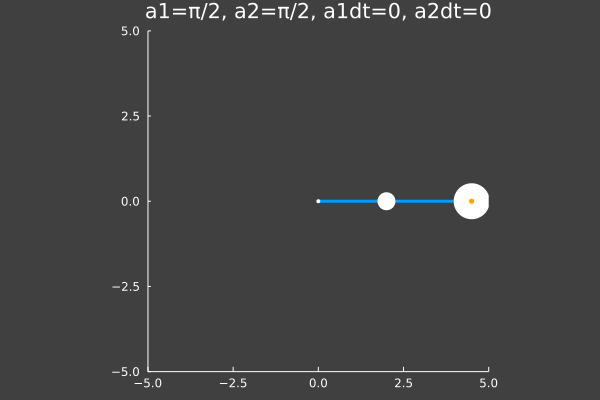


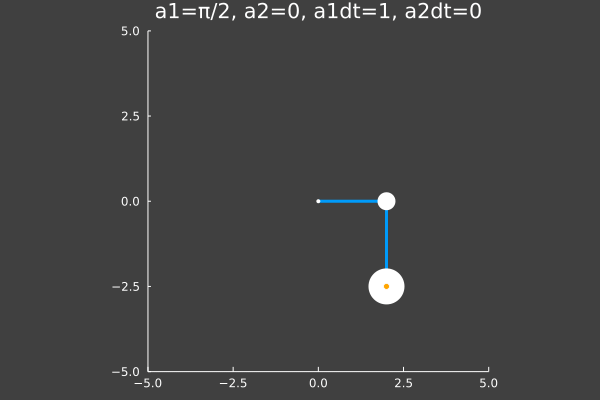

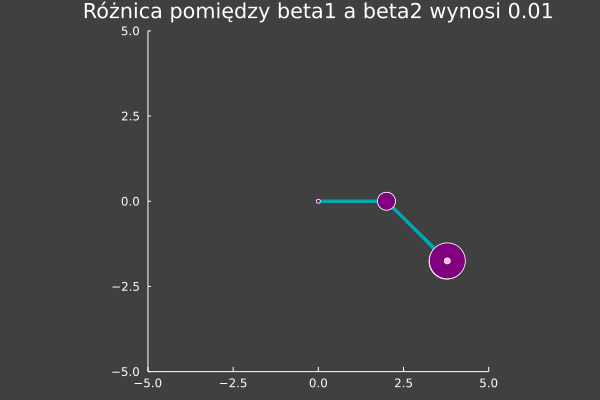